In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.stats import linregress, pearsonr
import plotly.express as px

In [57]:

MLP_data_to_load = "Resources/Median_list_Price.csv"
MSP_data_to_load = "Resources/Median_sale_price.csv"


In [58]:
Median_list_price = pd.read_csv(MLP_data_to_load)
Median_Sale_price = pd.read_csv(MSP_data_to_load)



In [59]:
melted_data = pd.melt(Median_list_price, id_vars=['RegionID', 'SizeRank', 'RegionName','StateName'],
                      var_name='Date', value_name='MedianListPrice')

# Convert the 'Date' column to datetime format
melted_data['Date'] = pd.to_datetime(melted_data['Date'])

In [61]:
melted_data.isnull().sum()

RegionID             0
SizeRank             0
RegionName           0
StateName            0
Date                 0
MedianListPrice    364
dtype: int64

In [62]:
melted_data_cleaned = melted_data.dropna()

In [63]:
MLP = melted_data_cleaned.drop_duplicates()
MLP.head()

,RegionID,SizeRank,RegionName,StateName,Date,MedianListPrice
0,394913,1,"New York, NY",NY,2018-03-31,503000.0
1,753899,2,"Los Angeles, CA",CA,2018-03-31,721333.0
2,394463,3,"Chicago, IL",IL,2018-03-31,284600.0
3,394514,4,"Dallas, TX",TX,2018-03-31,322997.0
4,394692,5,"Houston, TX",TX,2018-03-31,294467.0


In [65]:
row_count = len(MLP)
print("Number of rows:", row_count)

Number of rows: 45468


In [66]:
melt_data = pd.melt(Median_Sale_price, id_vars=['RegionID', 'SizeRank', 'RegionName','StateName'],
                      var_name='Date', value_name='MedianSalePrice')

# Convert the 'Date' column to datetime format
melt_data['Date'] = pd.to_datetime(melt_data['Date'])

In [67]:
melt_data.isnull().sum()

RegionID              0
SizeRank              0
RegionName            0
StateName             0
Date                  0
MedianSalePrice    3107
dtype: int64

In [68]:
melt_data_cleaned = melt_data.dropna()

In [69]:
MSP = melt_data_cleaned.drop_duplicates()
MSP.head()


,RegionID,SizeRank,RegionName,StateName,Date,MedianSalePrice
0,394913,1,"New York, NY",NY,2018-03-31,376000.0
1,753899,2,"Los Angeles, CA",CA,2018-03-31,608333.0
2,394463,3,"Chicago, IL",IL,2018-03-31,222833.0
3,394514,4,"Dallas, TX",TX,2018-03-31,244667.0
4,394692,5,"Houston, TX",TX,2018-03-31,212417.0


In [70]:
row_count = len(MSP)
print("Number of rows:", row_count)

Number of rows: 42725


In [71]:
house_prices = pd.merge(MLP, MSP, on=['RegionID', 'SizeRank', 'RegionName', 'StateName', 'Date'])

# Check the merged DataFrame
print(house_prices.head())

   RegionID  SizeRank       RegionName StateName       Date  MedianListPrice  \
0    394913         1     New York, NY        NY 2018-03-31         503000.0   
1    753899         2  Los Angeles, CA        CA 2018-03-31         721333.0   
2    394463         3      Chicago, IL        IL 2018-03-31         284600.0   
3    394514         4       Dallas, TX        TX 2018-03-31         322997.0   
4    394692         5      Houston, TX        TX 2018-03-31         294467.0   

   MedianSalePrice  
0         376000.0  
1         608333.0  
2         222833.0  
3         244667.0  
4         212417.0  


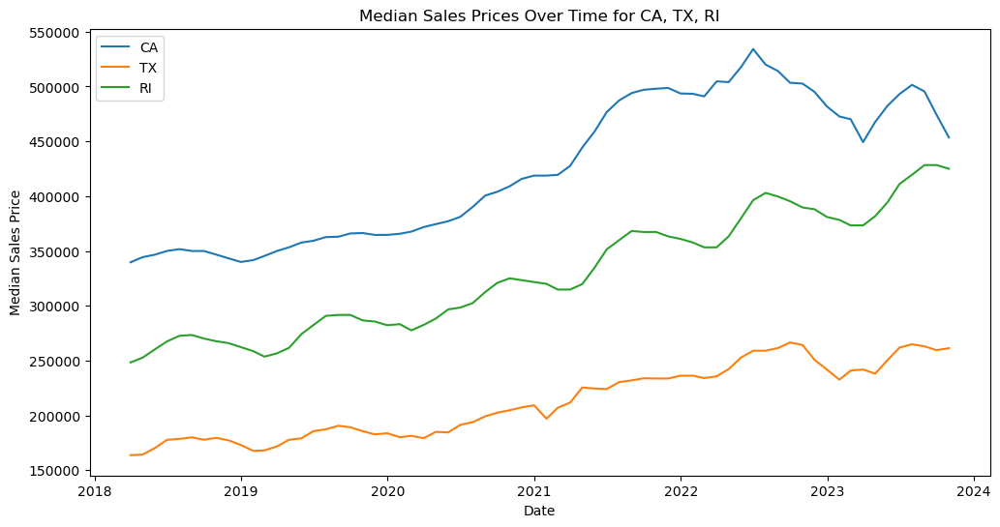

In [75]:
# Select 3 specific states
selected_states = ['CA', 'TX', 'RI']
df_selected = MSP[MSP['StateName'].isin(selected_states)]

# Group by 'State' and 'Date' and calculate the median sales price
grouped_data = df_selected.groupby(['StateName', 'Date'])['MedianSalePrice'].median().reset_index()

# Plotting
plt.figure(figsize=(12, 6))

for state in selected_states:
    state_data = grouped_data[grouped_data['StateName'] == state]
    plt.plot(state_data['Date'], state_data['MedianSalePrice'], label=state)

plt.title('Median Sales Prices Over Time for CA, TX, RI')
plt.xlabel('Date')
plt.ylabel('Median Sales Price')
plt.legend()
plt.show()

        Date  MedianListPrice  MedianSalePrice  price_discrepancy_percentage
0 2018-03-31         503000.0         376000.0                    -25.248509
1 2018-03-31         721333.0         608333.0                    -15.665442
2 2018-03-31         284600.0         222833.0                    -21.703092
3 2018-03-31         322997.0         244667.0                    -24.250999
4 2018-03-31         294467.0         212417.0                    -27.863903


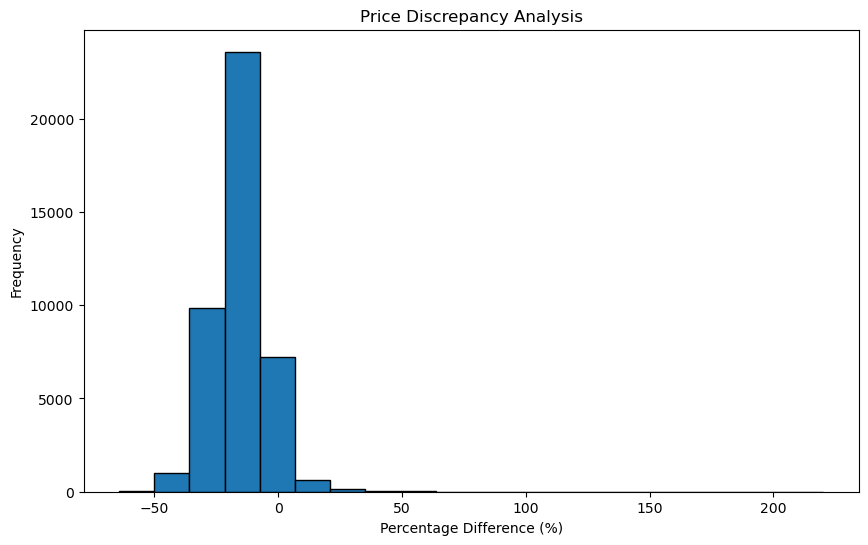

In [72]:

house_prices.reset_index(drop=True, inplace=True)

#  calculate the percentage difference
house_prices['price_discrepancy_percentage'] = ((house_prices['MedianSalePrice'] - house_prices['MedianListPrice']) / house_prices['MedianListPrice']) * 100

# Display the new column and relevant information
print(house_prices[['Date', 'MedianListPrice', 'MedianSalePrice', 'price_discrepancy_percentage']].head())

plt.figure(figsize=(10, 6))
plt.hist(house_prices['price_discrepancy_percentage'], bins=20, edgecolor='black')
plt.title('Price Discrepancy Analysis')
plt.xlabel('Percentage Difference (%)')
plt.ylabel('Frequency')
plt.show()

In [50]:
import dask.dataframe as dd

# Convert pandas DataFrames to Dask DataFrames
dask_msp = dd.from_pandas(MSP, npartitions=10)  # Adjust npartitions as needed
dask_mlp = dd.from_pandas(MLP, npartitions=10)

# Perform the merge operation using Dask
dask_merged_data = dd.merge(dask_msp, dask_mlp, on='RegionName', how='inner')

# Convert the Dask DataFrame back to a pandas DataFrame
house_prices = dask_merged_data.compute()

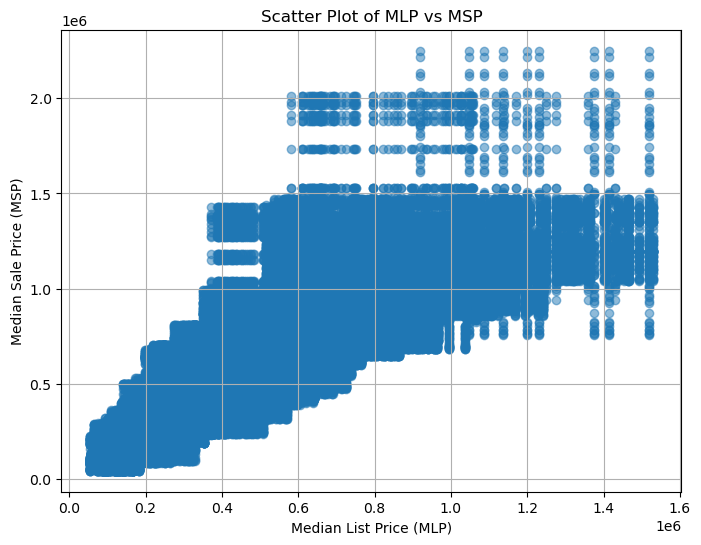

In [52]:
# Generate a scatter plot to visualize the relationship
plt.figure(figsize=(8, 6))
plt.scatter(house_prices['MedianSalePrice'], house_prices['MedianListPrice'], alpha=0.5)
plt.title('Scatter Plot of MLP vs MSP')
plt.xlabel('Median List Price (MLP)')
plt.ylabel('Median Sale Price (MSP)')
plt.grid(True)

Linear Regression: y = 0.72x + 31991.39
Correlation Coefficient: 0.88


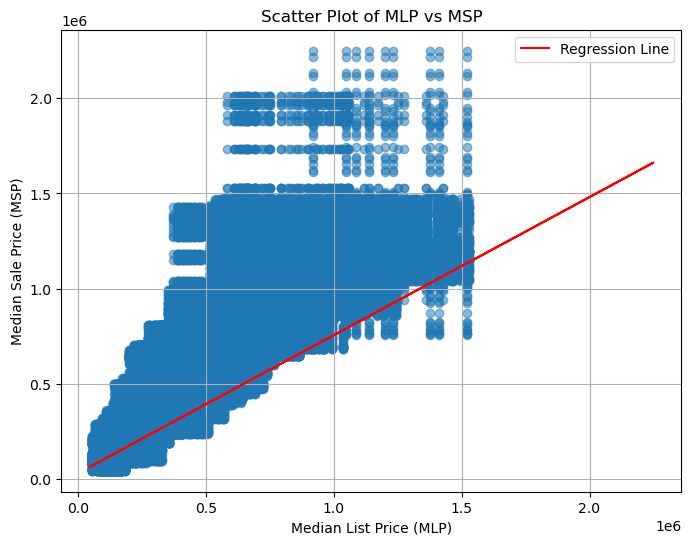

In [53]:
# Generate a scatter plot to visualize the relationship
plt.figure(figsize=(8, 6))
plt.scatter(house_prices['MedianSalePrice'], house_prices['MedianListPrice'], alpha=0.5)
plt.title('Scatter Plot of MLP vs MSP')
plt.xlabel('Median List Price (MLP)')
plt.ylabel('Median Sale Price (MSP)')
plt.grid(True)

# Perform linear regression
slope, intercept, r_value, p_value, std_err = linregress(house_prices['MedianListPrice'], house_prices['MedianSalePrice'])

# Calculate correlation coefficient
correlation_coefficient, _ = pearsonr(house_prices['MedianListPrice'], house_prices['MedianSalePrice'])

# Print regression information

print(f"Linear Regression: y = {slope:.2f}x + {intercept:.2f}")
print(f"Correlation Coefficient: {correlation_coefficient:.2f}")


# Plot the regression line
plt.plot(house_prices['MedianListPrice'], slope * house_prices['MedianListPrice'] + intercept, color='red', label='Regression Line')



# Show the plot
plt.legend()
plt.show()

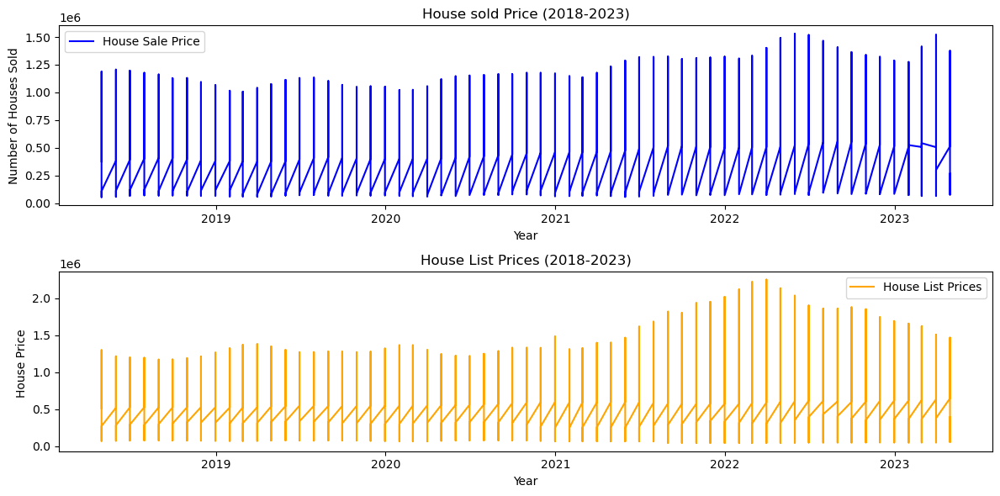

In [71]:
# Convert 'date' to datetime format if it's not already in that format
MSP['Date'] = pd.to_datetime(MSP['Date'])
MLP['Date'] = pd.to_datetime(MLP['Date'])

# Filter data for the period 2008-2022
sales_data_filtered = MSP[(MSP['Date'] >= '2018-04-01') & (MSP['Date'] <= '2023-04-30')]
prices_data_filtered = MLP[(MLP['Date'] >= '2018-04-01') & (MLP['Date'] <= '2023-04-30')]

# Plotting the data
plt.figure(figsize=(12, 6))

# Plotting house sales
plt.subplot(2, 1, 1)
plt.plot(sales_data_filtered['Date'], sales_data_filtered['MedianSalePrice'], label='House Sale Price', color='blue')
plt.title('House sold Price (2018-2023)')
plt.xlabel('Year')
plt.ylabel('Number of Houses Sold')
plt.legend()

# Plotting house prices
plt.subplot(2, 1, 2)
plt.plot(prices_data_filtered['Date'], prices_data_filtered['MedianListPrice'], label='House List Prices', color='orange')
plt.title('House List Prices (2018-2023)')
plt.xlabel('Year')
plt.ylabel('House Price ')
plt.legend()

plt.tight_layout()
plt.show()

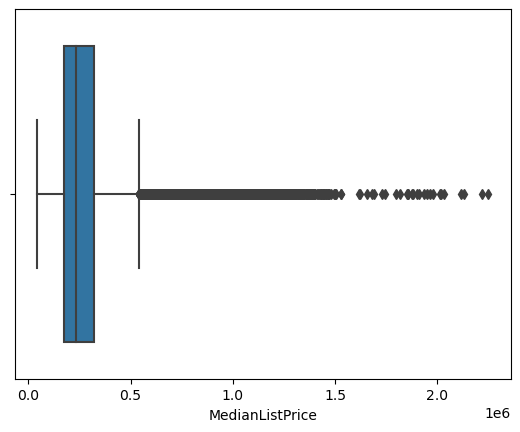

In [72]:
# Boxplot reflecting outliers
sns.boxplot(x=MLP['MedianListPrice'])
plt.show()

Box Plots:
Box plots visually represent the distribution of data and  identify outliers.Outliers are the points that fall beyond the "whiskers" of the box plot.

In [74]:
from scipy import stats

z_scores = stats.zscore(MLP['MedianListPrice'])
outliers = (z_scores > 3) | (z_scores < -3)
outlier_indices = MLP.index[outliers]

print(outlier_indices)

Index([   11,    34,   122,   123,   179,   427,   437,   448,   517,   643,
       ...
       45459, 45498, 45572, 45585, 45595, 45606, 45675, 45712, 45801, 45815],
      dtype='int64', length=1039)


In [75]:
Q1 = MLP['MedianListPrice'].quantile(0.25)
Q3 = MLP['MedianListPrice'].quantile(0.75)
IQR = Q3 - Q1

outliers = (MLP['MedianListPrice'] < Q1 - 1.5 * IQR) | (MLP['MedianListPrice'] > Q3 + 1.5 * IQR)
outlier_indices = MLP.index[outliers]

print("Indices of outliers:", outlier_indices)

Indices of outliers: Index([    1,    11,    16,    34,    53,    58,    69,   110,   122,   123,
       ...
       45709, 45712, 45723, 45746, 45766, 45787, 45791, 45801, 45815, 45830],
      dtype='int64', length=2960)


This indicates that there are 2960 rows (data points) identified as outliers, and the indices of these rows are given in the list. Each number in the list represents the row index in your original DataFrame where an outlier was detected.

In [76]:
outlier_indices = [    1,    11,    16,    34,    53,    58,    69,   110,   122,   123, 45709, 45712, 45723, 45746, 45766, 45787, 45791, 45801, 45815, 45830]
outliers_data = melted_data.iloc[outlier_indices]

print(outliers_data)

       RegionID  SizeRank                RegionName RegionType StateName  \
1        753899         2           Los Angeles, CA        msa        CA   
11       395057        12         San Francisco, CA        msa        CA   
16       395056        17             San Diego, CA        msa        CA   
34       395059        36              San Jose, CA        msa        CA   
53       753924        55        Urban Honolulu, HI        msa        HI   
58       394415        60            Bridgeport, CT        msa        CT   
69       394952        71                Oxnard, CA        msa        CA   
110      395068       112            Santa Rosa, CA        msa        CA   
122      753917       124           Santa Maria, CA        msa        CA   
123      395050       125               Salinas, CA        msa        CA   
45709    753905       604               Newport, OR        msa        OR   
45712    394628       610  Gardnerville Ranchos, NV        msa        NV   
45723    394

Based on the context of our study, the nature of the data, and the goals of your analysis keeping the outliers is beneficial as they essential for understanding the phenomena being studied. A sample of the outlier was reviewed and all the regions listed are expected to have higher house Prices

In [20]:
# Convert specific columns to desired data types
MLP['RegionID'] = MLP['RegionID'].astype(str)
MLP['SizeRank'] = MLP['SizeRank'].astype(str)
MLP['RegionName'] = MLP['RegionName'].astype(str)
MLP['RegionType'] = MLP['RegionType'].astype(str)
MLP['StateName'] = MLP['StateName'].astype(str)
MLP['MedianListPrice'] = MLP['MedianListPrice'].astype(float)

# Convert the 'Date' column to datetime format (if not already)
MLP['Date'] = pd.to_datetime(MLP['Date'])

In [21]:
# Display summary statistics of the numerical columns
print(MLP.describe())

                                Date  MedianListPrice
count                          45468     4.546800e+04
mean   2021-01-16 03:23:23.325415424     2.785907e+05
min              2018-03-31 00:00:00     4.490000e+04
25%              2019-08-31 00:00:00     1.740670e+05
50%              2021-01-31 00:00:00     2.349670e+05
75%              2022-06-30 00:00:00     3.216000e+05
max              2023-10-31 00:00:00     2.249000e+06
std                              NaN     1.745529e+05


In [76]:
house_prices.head()

,RegionID,SizeRank,RegionName,StateName,Date,MedianListPrice,MedianSalePrice,price_discrepancy_percentage
0,394913,1,"New York, NY",NY,2018-03-31,503000.0,376000.0,-25.248509
1,753899,2,"Los Angeles, CA",CA,2018-03-31,721333.0,608333.0,-15.665442
2,394463,3,"Chicago, IL",IL,2018-03-31,284600.0,222833.0,-21.703092
3,394514,4,"Dallas, TX",TX,2018-03-31,322997.0,244667.0,-24.250999
4,394692,5,"Houston, TX",TX,2018-03-31,294467.0,212417.0,-27.863903


In [ ]:
#by state
df['Date'] = pd.to_datetime(df['Date'])

# Calculate the percentage difference between median list price and median sale price
df['Price_Discrepancy_Percentage'] = ((df['Median_Sale_Price'] - df['Median_List_Price']) / df['Median_List_Price']) * 100

# Group by state and calculate the average price discrepancy for each state
state_price_discrepancy = df.groupby('State')['Price_Discrepancy_Percentage'].mean().reset_index()

# Display the result
print(state_price_discrepancy)

# Visualize the average price discrepancy for each state
plt.figure(figsize=(12, 6))
plt.bar(state_price_discrepancy['State'], state_price_discrepancy['Price_Discrepancy_Percentage'])
plt.title('Average Price Discrepancy by State')
plt.xlabel('State')
plt.ylabel('Average Price Discrepancy Percentage')
plt.show()

In [80]:

# Create an interactive time series plot
fig = px.line(MLP, x='Date', y='MedianListPrice', title='Interactive Time Series House List Price',
              labels={'MedianListPrice': 'MedianListPrice'}, template='plotly', markers=True)

# Add a scatter plot to show markers with tooltips
fig.add_scatter(x=MLP['Date'], y=MLP['MedianListPrice'],
                mode='markers+text',
                marker=dict(color='blue', size=10),
                hoverinfo='skip',  # Hide hoverinfo for the line plot
                name='')

# Update layout for better visibility
fig.update_layout(hovermode='closest', showlegend=False)

# Show the interactive plot
fig.show()

In [81]:
# Create an interactive bar chart
fig = px.bar(MLP, x='StateName', y='MedianListPrice', title='Median List Price by State',
             labels={'StateName': 'State', 'MedianListPrice': 'Median Price'},
             template='plotly', color='StateName', height=500)

# Show the interactive plot
fig.show()

In [87]:
# Create an interactive map
fig = px.scatter_geo(
    MSP,
    locations='StateName',
    locationmode='USA-states',  # Set locationmode to 'USA' for USA-only map
    color='MedianSalePrice',
    hover_name='RegionName',
    size='MedianSalePrice',
    scope='usa',  # Set the scope to 'usa'
    title='Geospatial Visualization of Median Sale Price in the USA',
    template='plotly',
    color_continuous_scale='Viridis'
)

# Show the interactive map
fig.show()